In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# rOT

In [3]:
model0 = Doc2Vec.load('rOT/doc2vec.0.model')
model1 = Doc2Vec.load('rOT/doc2vec.1.model')

In [4]:
print(model0)
print(model1)

Doc2Vec(dbow,d70,n5,s0.001)
Doc2Vec(dm/m,d70,n5,w4,s0.001)


In [5]:
## Behavior Mapping

behaviorCategories = {'exploratory':[0,1,3,4,5,8,9,11,12,13,15,17,20,21,25,27,29,32,52,54,62],
    'grooming':[39,43,44,49,55,57,59,60,61],
        'pause':[6,7,10,14,16,23,26,28,30,31,33,37,41,46,47,50,58],
            'rearing':[2,18,19,22,24,34,35,36,38,40,42,45,48,51,53,56]}

colors = {'exploratory':'r', 'grooming':'g', 'pause':'b','rearing':'y'}

moduleSet = set()
for behavior,module in behaviorCategories.items():
    print(len(module))
    moduleSet.update(module)

print(len(moduleSet))

21
9
17
16
63


In [6]:
def reduce_dimensions(model,perplexity):
    num_dimensions = 2  # final num dimensions (2D, 3D, etc)

    # extract the words & their vectors, as numpy arrays
    vectors = np.asarray(model.wv.vectors)
    labels = np.asarray(model.wv.index_to_key)  # fixed-width numpy strings

    # reduce using t-SNE
    tsne = TSNE(n_components=num_dimensions,perplexity=perplexity, random_state=0)
    vectors = tsne.fit_transform(vectors)
    x_vals = [v[0] for v in vectors]
    y_vals = [v[1] for v in vectors]
    return x_vals, y_vals, labels


def plot_with_matplotlib(x_vals, y_vals, labels, axis, perplexity):
    import random

    random.seed(0)
    c = []
    # print(labels)
    for label in labels:
        color_appended = 0
        for key, value in behaviorCategories.items():
            if int(label) in value:
                c.append(colors[key])
                color_appended = 1
        if color_appended!=1:
            c.append('c')
    # axis.figure(figsize=(12, 12))
    axis.scatter(x_vals, y_vals, c=c)

    #
    # Label randomly subsampled 25 data points?
    #
    indices = list(range(len(labels)))
    selected_indices = random.sample(indices, 25)
    for i in selected_indices:
        axis.annotate(labels[i], (x_vals[i], y_vals[i]))
    axis.set_title("Perplexity=%d" % perplexity, color="white")

# x_vals, y_vals, labels = reduce_dimensions(model0, 8)
# plot_with_matplotlib(x_vals, y_vals, labels)

In [7]:

def reduce_dimensions_3D(model,perplexity):
    num_dimensions = 3  # final num dimensions (2D, 3D, etc)

    # extract the words & their vectors, as numpy arrays
    vectors = np.asarray(model.wv.vectors)
    labels = np.asarray(model.wv.index_to_key)  # fixed-width numpy strings

    # reduce using t-SNE
    tsne = TSNE(n_components=num_dimensions,perplexity=perplexity, random_state=0)
    vectors = tsne.fit_transform(vectors)
    x_vals = [v[0] for v in vectors]
    y_vals = [v[1] for v in vectors]
    z_vals = [v[2] for v in vectors]
    return x_vals, y_vals, z_vals, labels


def plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, axis, perplexity):
    import random

    random.seed(0)
    c = []
    # print(labels)
    for label in labels:
        color_appended = 0
        for key, value in behaviorCategories.items():
            if int(label) in value:
                c.append(colors[key])
                color_appended = 1
        if color_appended!=1:
            c.append('c')
    # axis.figure(figsize=(12, 12))
    axis.scatter(x_vals, y_vals, z_vals, c=c)

    #
    # Label randomly subsampled 25 data points
    #
    indices = list(range(len(labels)))
    selected_indices = random.sample(indices, 25)
    for i in selected_indices:
        axis.annotate(labels[i], (x_vals[i], y_vals[i]))
    axis.set_title("Perplexity=%d" % perplexity, color="white")

# x_vals, y_vals, labels = reduce_dimensions(model0, 8)
# plot_with_matplotlib(x_vals, y_vals, labels)

In [8]:
for key, value in behaviorCategories.items():
    print(value)

[0, 1, 3, 4, 5, 8, 9, 11, 12, 13, 15, 17, 20, 21, 25, 27, 29, 32, 52, 54, 62]
[39, 43, 44, 49, 55, 57, 59, 60, 61]
[6, 7, 10, 14, 16, 23, 26, 28, 30, 31, 33, 37, 41, 46, 47, 50, 58]
[2, 18, 19, 22, 24, 34, 35, 36, 38, 40, 42, 45, 48, 51, 53, 56]


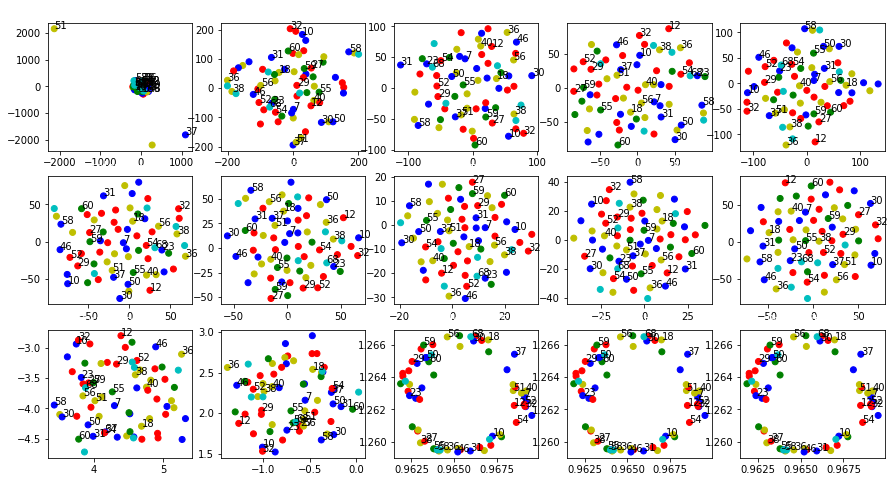

In [10]:
## Model 0
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model0, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)
    

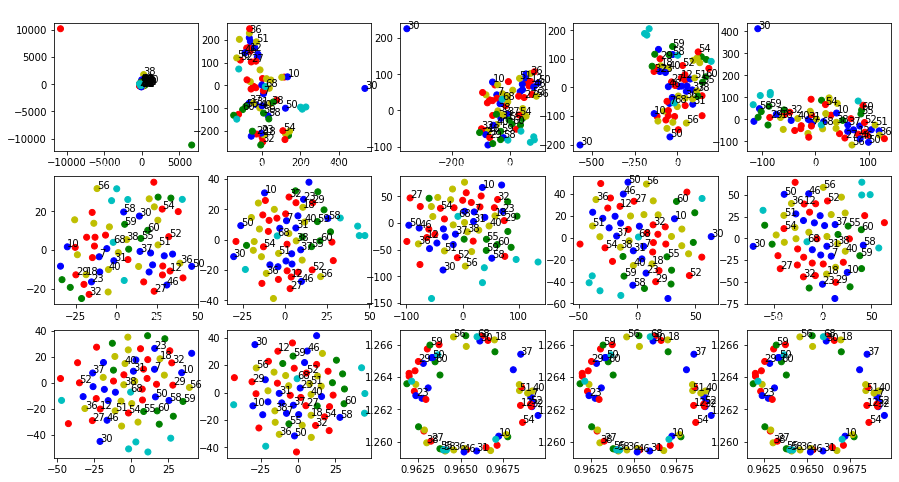

In [11]:
## Model 1
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip(fig.axes,perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model1, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

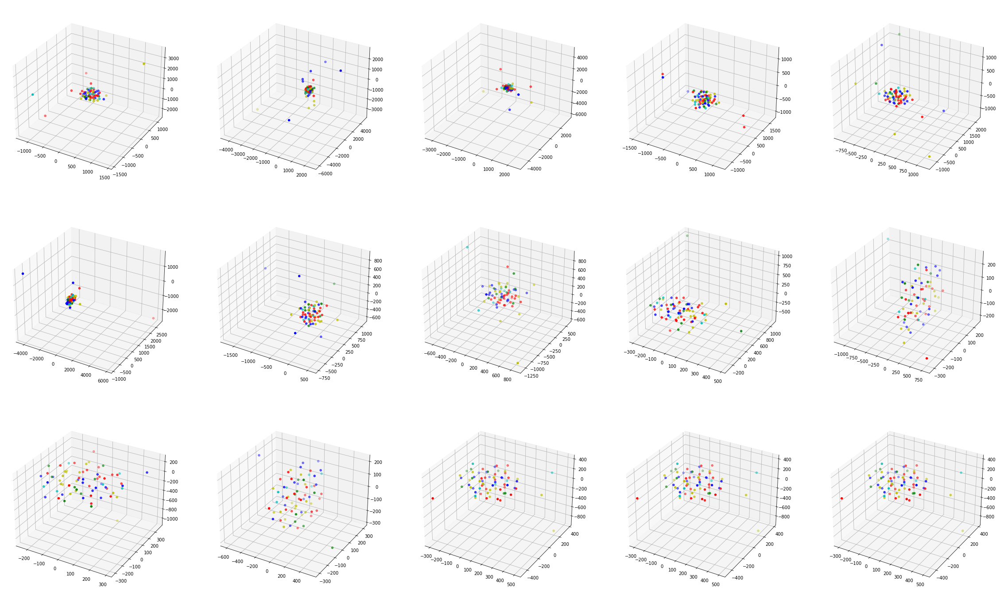

In [12]:
## Model 0
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model0, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

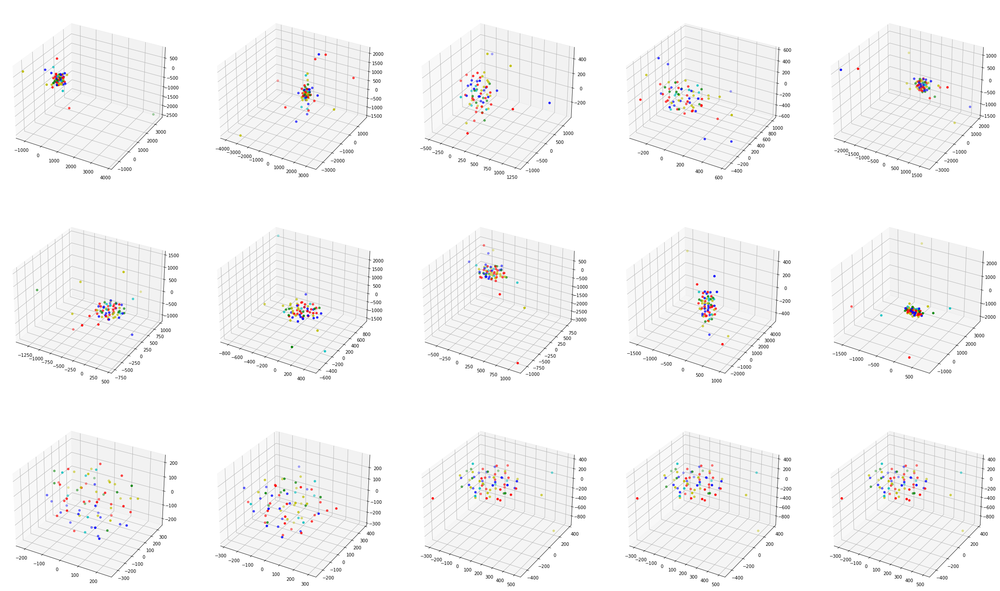

In [13]:
## Model 1
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model1, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

# rST

In [14]:
model0 = Doc2Vec.load('rST/doc2vec.0.model')
model1 = Doc2Vec.load('rST/doc2vec.1.model')

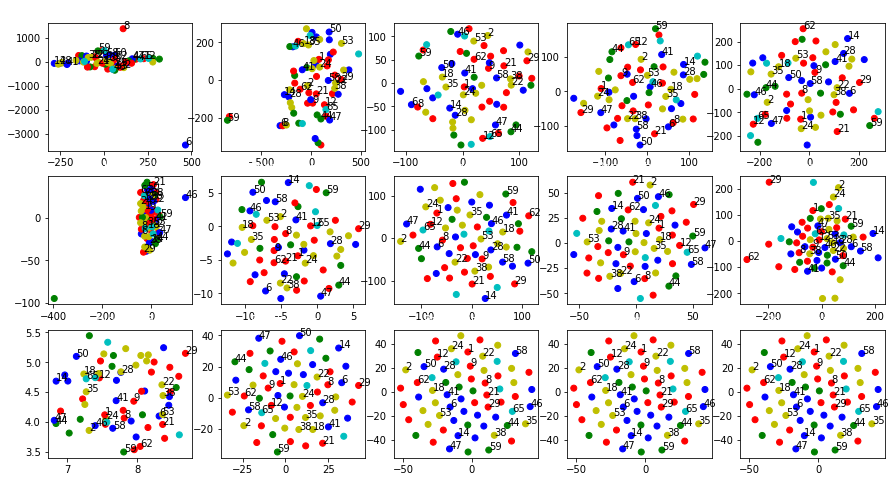

In [15]:
## Model 0
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model0, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

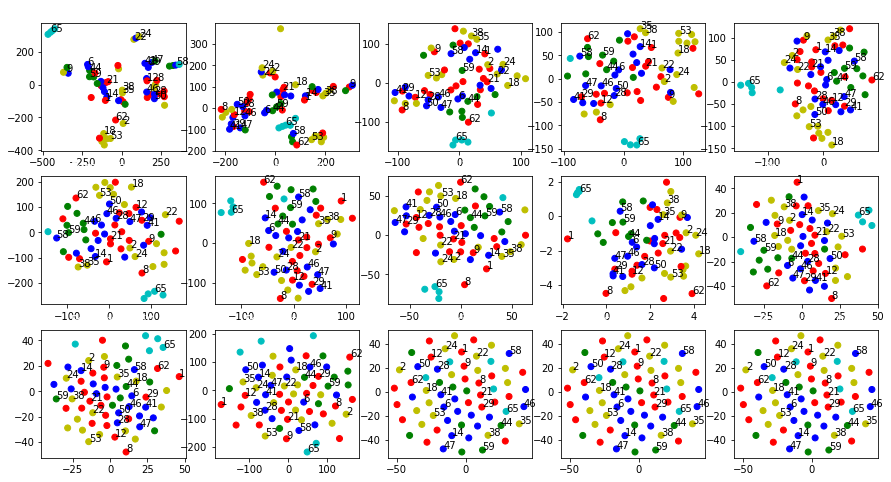

In [16]:
## Model 1
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model1, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

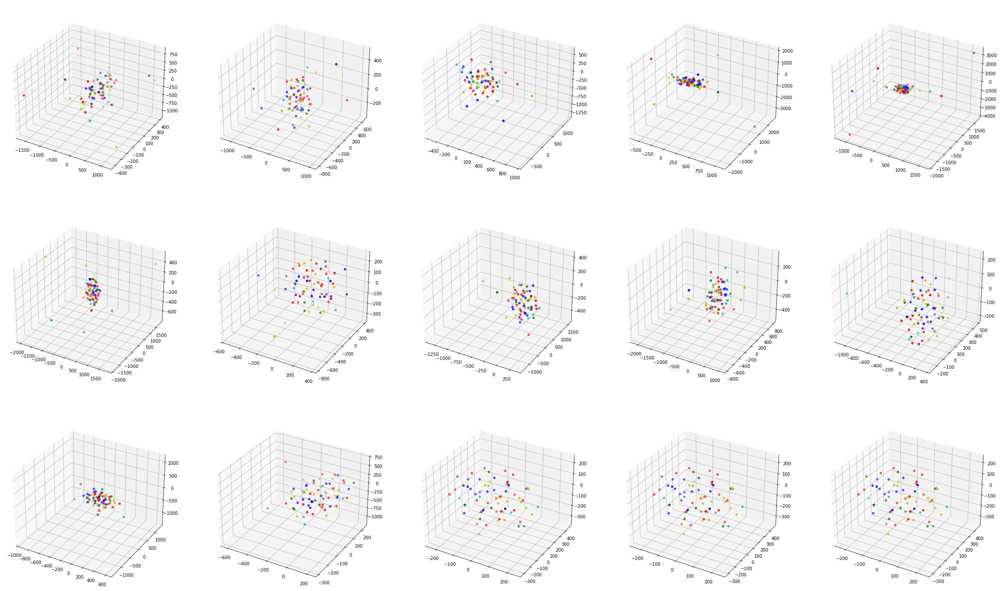

In [17]:
## Model 0
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model0, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

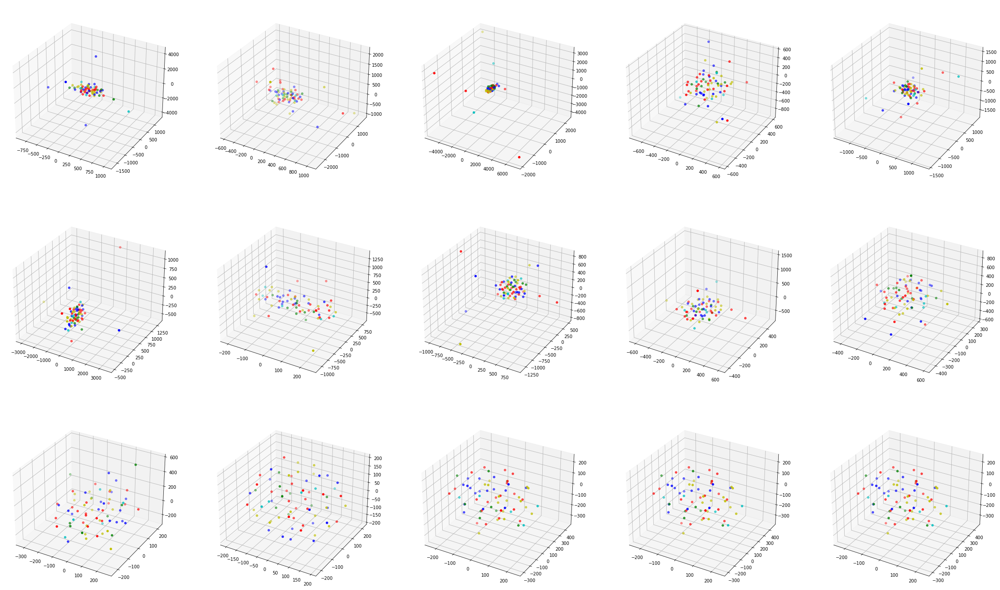

In [18]:
## Model 1
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model1, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

# gOT

In [19]:
model0 = Doc2Vec.load('gOT/doc2vec.0.model')
model1 = Doc2Vec.load('gOT/doc2vec.1.model')

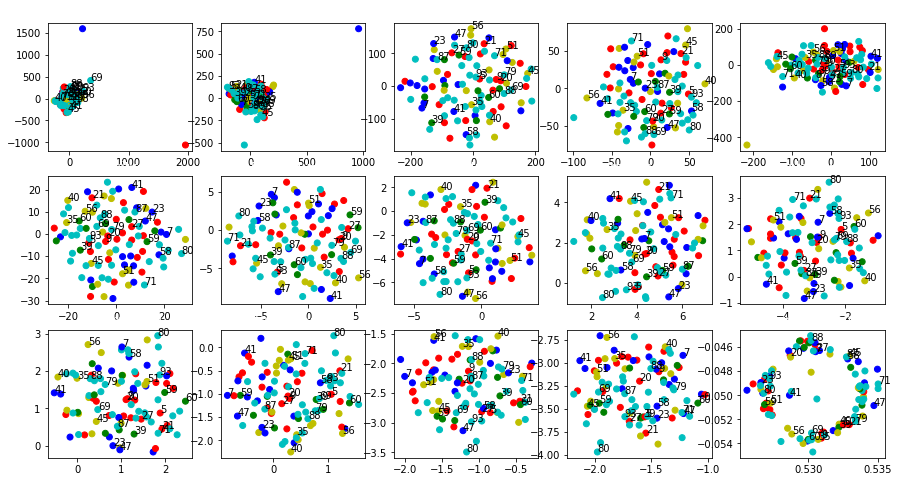

In [20]:
## Model 0
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model0, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

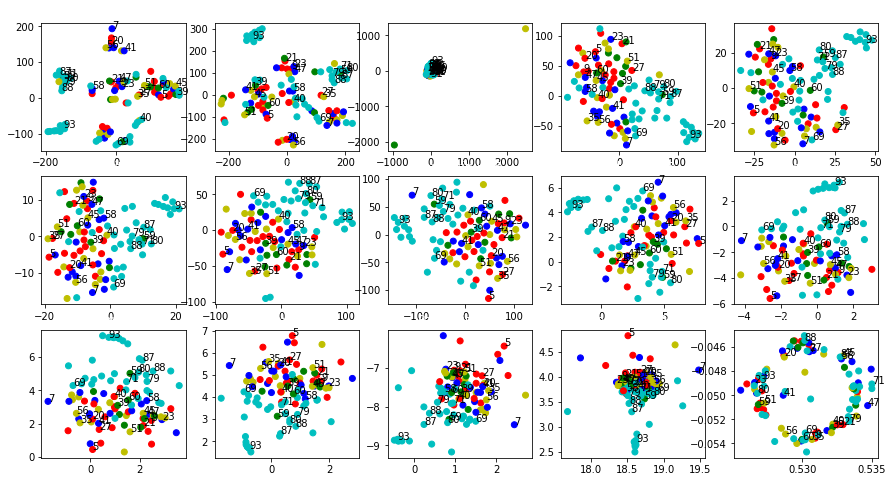

In [21]:
## Model 1
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model1, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

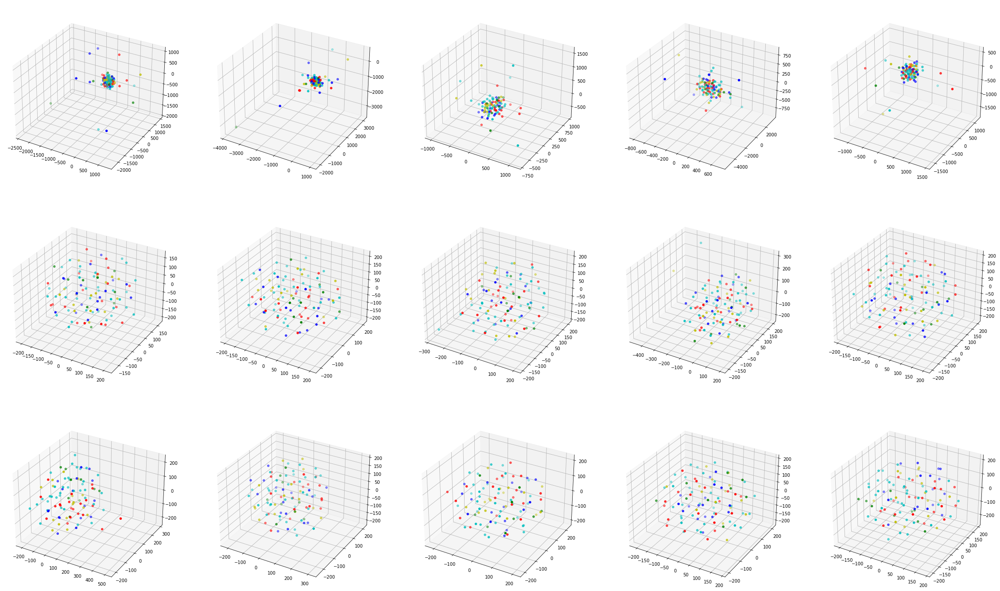

In [22]:
## Model 0
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model0, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

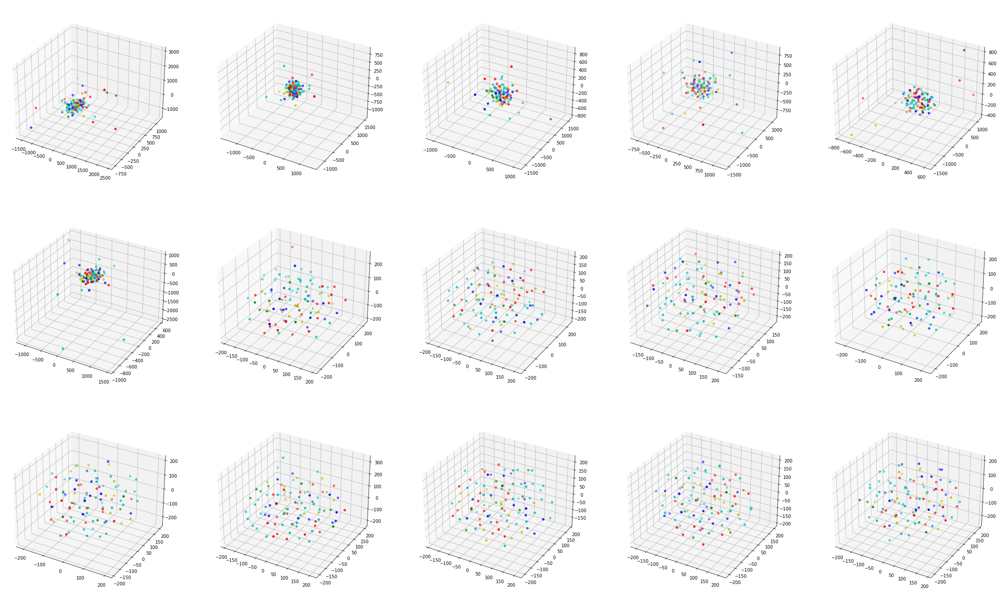

In [23]:
## Model 1
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model1, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

# gST

In [24]:
model0 = Doc2Vec.load('gST/doc2vec.0.model')
model1 = Doc2Vec.load('gST/doc2vec.1.model')

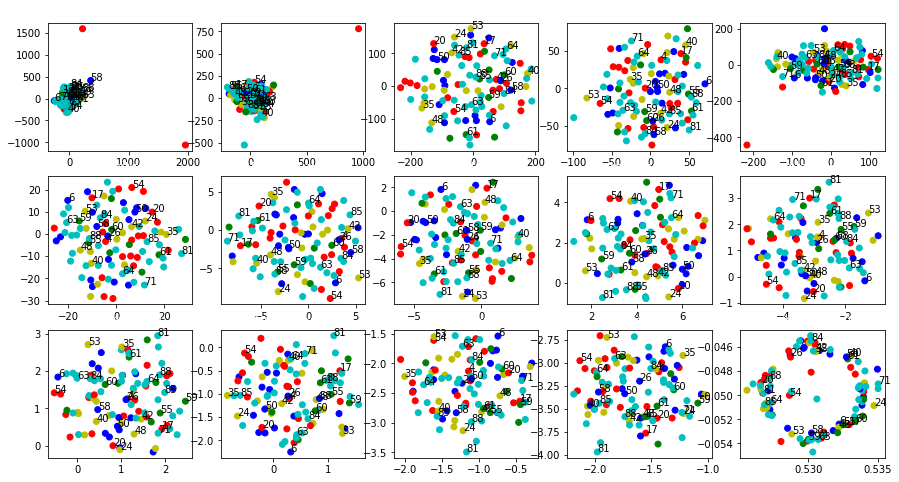

In [25]:
## Model 0
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model0, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

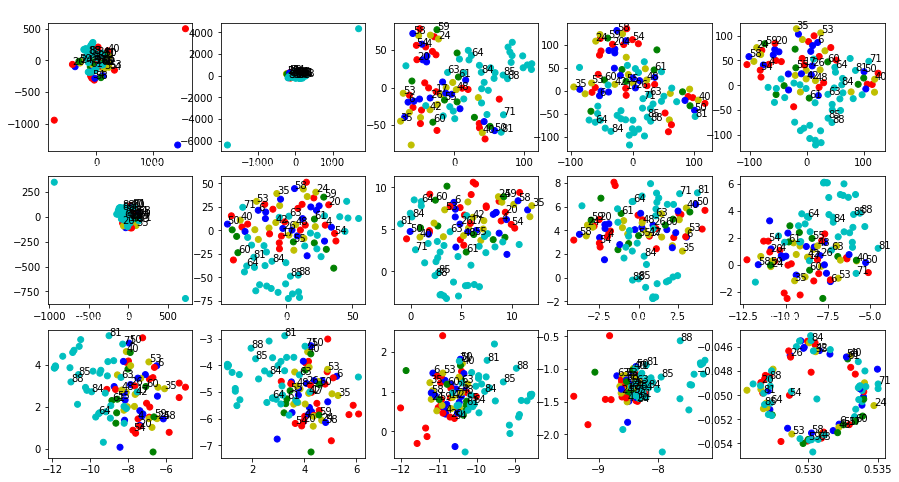

In [26]:
## Model 1
(fig, subplots) = plt.subplots(3,5, figsize = (15,8))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for ax, perplexity in zip((fig.axes),perplexities):
    x_vals, y_vals, labels = reduce_dimensions(model1, perplexity)
    plot_with_matplotlib(x_vals, y_vals, labels, ax, perplexity)

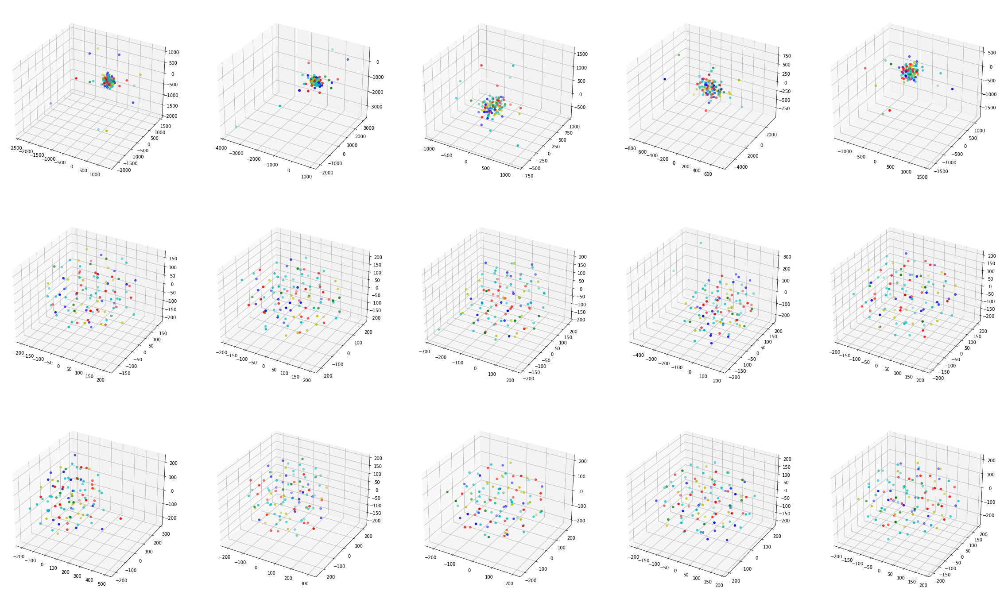

In [27]:
## Model 0
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model0, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)

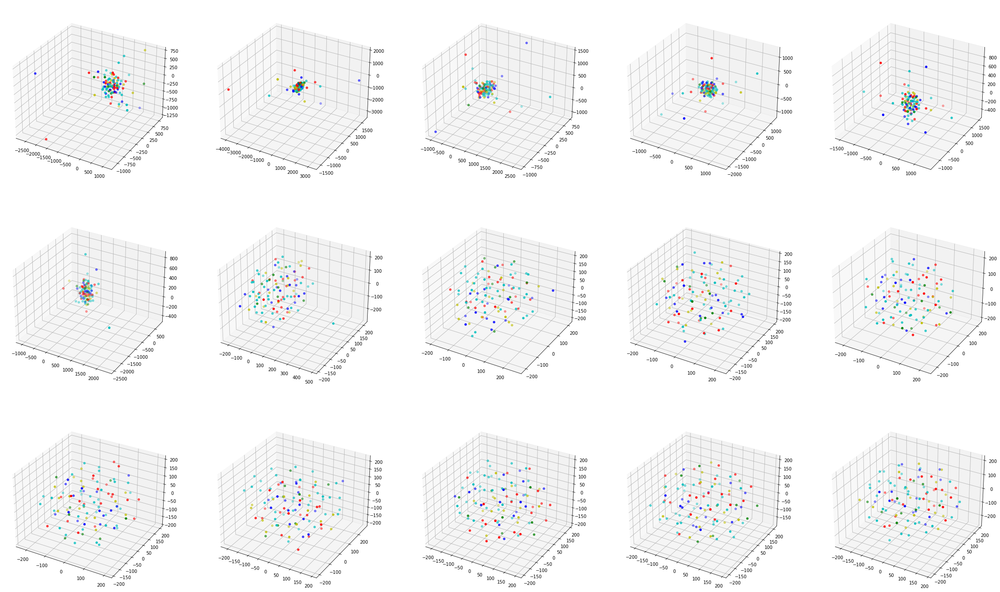

In [28]:
## Model 1
fig = plt.figure(figsize=(40,24))
perplexities = [2,4,8,10,12,16,20,25,35,40,50,60,75,90,100]
len(perplexities)

for i, perplexity in enumerate(perplexities):
    ax = fig.add_subplot(3, 5, i+1, projection='3d')
    x_vals, y_vals, z_vals, labels = reduce_dimensions_3D(model1, perplexity)
    plot_with_matplotlib_3D(x_vals, y_vals, z_vals, labels, ax, perplexity)